In [39]:
import numpy as np
from geopy.distance import geodesic
from tqdm import tqdm
import pandas as pd
import numpy as np
from scipy.spatial import KDTree
import re
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
from datetime import datetime
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier
from sklearn.utils.class_weight import compute_class_weight

# tf and keras
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras import models
from keras import layers
from tensorflow.keras import initializers

# sklearn
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score


# plots
import seaborn as sns
import matplotlib.pyplot as plt

In [19]:
final_matched_data = pd.read_csv('/Users/austinblee/Downloads/matched_data_20_miles.csv')
pd.set_option('display.max_columns', None)

print(final_matched_data['fire_occurred'].sum())
final_matched_data.head()

2367


,Stn Id,Stn Name,CIMIS Region,Date,Jul,ETo (mm),qc,Precip (mm),qc.1,Sol Rad (W/sq.m),qc.2,Avg Vap Pres (kPa),qc.3,Max Air Temp (C),qc.4,Min Air Temp (C),qc.5,Avg Air Temp (C),qc.6,Max Rel Hum (%),qc.7,Min Rel Hum (%),qc.8,Avg Rel Hum (%),qc.9,Dew Point (C),qc.10,Avg Wind Speed (m/s),qc.11,Wind Run (km),qc.12,Avg Soil Temp (C),qc.13,StationNbr,Latitude,Longitude,fire_occurred
0,181,Westmorland North,Imperial/Coachella Valley,2021-01-01,1,1.96,,0.0,,159.0,R,0.7,,20.8,,3.9,,12.4,,78.0,,31.0,,51.0,,2.5,,1.2,,99.9,,11.0,,181,33.078611,-115.66056,0
1,181,Westmorland North,Imperial/Coachella Valley,2021-01-02,2,1.63,,0.0,,152.0,,0.8,,19.3,,1.0,,9.2,,85.0,,39.0,,65.0,,2.9,,0.5,,40.6,,11.0,,181,33.078611,-115.66056,0
2,181,Westmorland North,Imperial/Coachella Valley,2021-01-03,3,1.57,R,0.0,,149.0,,0.8,,20.5,,1.5,,9.8,,88.0,,35.0,,67.0,,3.9,,0.5,,40.8,,10.9,,181,33.078611,-115.66056,0
3,181,Westmorland North,Imperial/Coachella Valley,2021-01-04,4,1.69,R,0.0,,154.0,,0.9,,22.8,,2.3,,10.4,,88.0,,36.0,,68.0,,4.6,,0.5,,39.0,,10.8,,181,33.078611,-115.66056,0
4,181,Westmorland North,Imperial/Coachella Valley,2021-01-05,5,1.74,,0.0,,162.0,R,0.9,,23.7,,1.5,,10.2,,92.0,,42.0,,73.0,,5.5,,0.6,,48.5,,10.9,,181,33.078611,-115.66056,0


In [4]:
qc_columns = ['qc.1', 'qc.2', 'qc.3', 'qc.4', 'qc.5', 'qc.6', 'qc.7', 'qc.8', 'qc.9', 'qc.10', 'qc.11', 'qc.12', 'qc.13']


excluded_flags = {'M', 'I', 'S'} #these are flags that are unreliable https://cimis.water.ca.gov/Content/PDF/CurrentFlags2.pdf


#convert all qc cols to strings 
qc_data = final_matched_data[qc_columns].astype(str)

# mark rows that contain any excluded flag
def contains_excluded_flag(series, excluded_flags):
    return series.apply(lambda val: any(flag in val for flag in excluded_flags))

# check across each QC column
column_masks = qc_data.apply(lambda col: ~contains_excluded_flag(col, excluded_flags)) #pass each column in data to contains excluded flag function and keep rows that are true

# keep only true rows that don't have MIS
mask = column_masks.all(axis=1)

# this is to check how many fires would be removed
excluded_fire_count = final_matched_data[~mask]['fire_occurred'].sum()

# check how many rows removed 
rows_removed = (~mask).sum()

print(f"Fires excluded by removing rows with M/I/S QC flags: {excluded_fire_count}")
print(f"Total rows removed: {rows_removed}")

cleaned_data = final_matched_data[mask]
cleaned_data.shape

Fires excluded by removing rows with M/I/S QC flags: 96
Total rows removed: 13913


(202732, 37)

In [5]:
cleaned_data.head()

,Stn Id,Stn Name,CIMIS Region,Date,Jul,ETo (mm),qc,Precip (mm),qc.1,Sol Rad (W/sq.m),qc.2,Avg Vap Pres (kPa),qc.3,Max Air Temp (C),qc.4,Min Air Temp (C),qc.5,Avg Air Temp (C),qc.6,Max Rel Hum (%),qc.7,Min Rel Hum (%),qc.8,Avg Rel Hum (%),qc.9,Dew Point (C),qc.10,Avg Wind Speed (m/s),qc.11,Wind Run (km),qc.12,Avg Soil Temp (C),qc.13,StationNbr,Latitude,Longitude,fire_occurred
0,181,Westmorland North,Imperial/Coachella Valley,2021-01-01,1,1.96,,0.0,,159.0,R,0.7,,20.8,,3.9,,12.4,,78.0,,31.0,,51.0,,2.5,,1.2,,99.9,,11.0,,181,33.078611,-115.66056,0
1,181,Westmorland North,Imperial/Coachella Valley,2021-01-02,2,1.63,,0.0,,152.0,,0.8,,19.3,,1.0,,9.2,,85.0,,39.0,,65.0,,2.9,,0.5,,40.6,,11.0,,181,33.078611,-115.66056,0
2,181,Westmorland North,Imperial/Coachella Valley,2021-01-03,3,1.57,R,0.0,,149.0,,0.8,,20.5,,1.5,,9.8,,88.0,,35.0,,67.0,,3.9,,0.5,,40.8,,10.9,,181,33.078611,-115.66056,0
3,181,Westmorland North,Imperial/Coachella Valley,2021-01-04,4,1.69,R,0.0,,154.0,,0.9,,22.8,,2.3,,10.4,,88.0,,36.0,,68.0,,4.6,,0.5,,39.0,,10.8,,181,33.078611,-115.66056,0
4,181,Westmorland North,Imperial/Coachella Valley,2021-01-05,5,1.74,,0.0,,162.0,R,0.9,,23.7,,1.5,,10.2,,92.0,,42.0,,73.0,,5.5,,0.6,,48.5,,10.9,,181,33.078611,-115.66056,0


In [6]:
feature_cols = [
    'ETo (mm)', 'Precip (mm)', 'Sol Rad (W/sq.m)', 'Avg Vap Pres (kPa)',
    'Max Air Temp (C)', 'Min Air Temp (C)', 'Avg Air Temp (C)',
    'Max Rel Hum (%)', 'Min Rel Hum (%)', 'Avg Rel Hum (%)',
    'Dew Point (C)', 'Avg Wind Speed (m/s)', 'Wind Run (km)', 'Avg Soil Temp (C)'
]

label = 'fire_occurred'

filtered_clean_data = pd.concat([cleaned_data[feature_cols], cleaned_data[[label]]], axis=1)

filtered_clean_data.head()
print(filtered_clean_data.dtypes)

ETo (mm)                float64
Precip (mm)             float64
Sol Rad (W/sq.m)        float64
Avg Vap Pres (kPa)      float64
Max Air Temp (C)        float64
Min Air Temp (C)        float64
Avg Air Temp (C)        float64
Max Rel Hum (%)         float64
Min Rel Hum (%)         float64
Avg Rel Hum (%)         float64
Dew Point (C)           float64
Avg Wind Speed (m/s)    float64
Wind Run (km)           float64
Avg Soil Temp (C)       float64
fire_occurred             int64
dtype: object


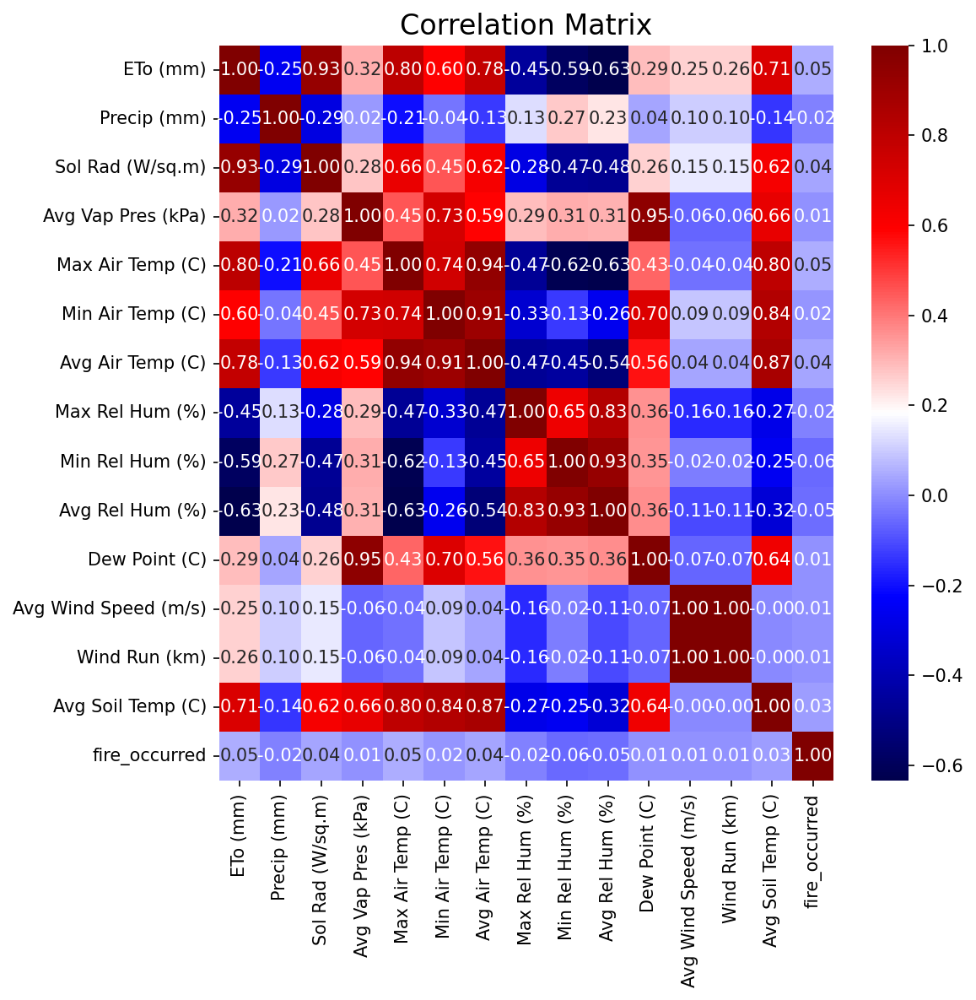

In [7]:
plt.figure(figsize=(8, 8), dpi=150)  # add dpi
sns.heatmap(filtered_clean_data.corr(),annot=True,fmt='.2f',cmap='seismic',
)
plt.title("Correlation Matrix", fontsize=16)
plt.tight_layout()
plt.show()

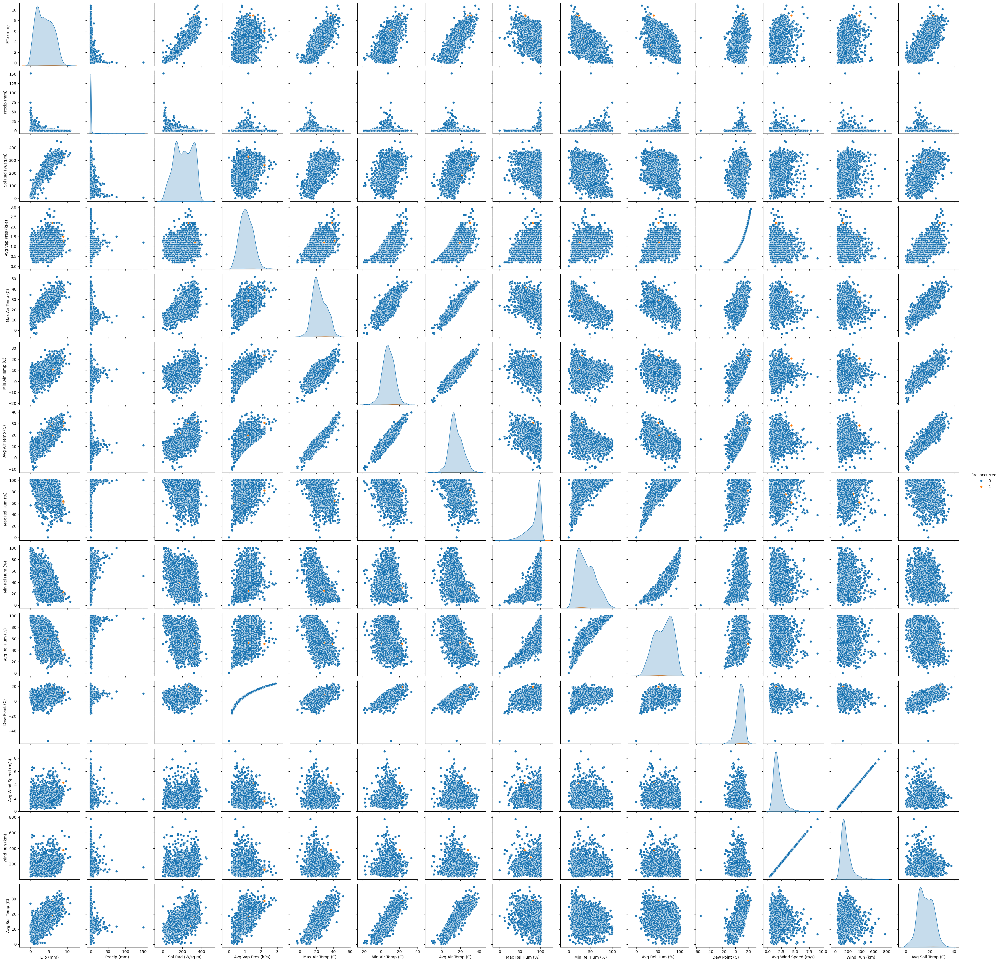

In [30]:
sns.pairplot(filtered_clean_data.sample(2500), hue='fire_occurred') #2500 to roughly capture 1 fire in this hue

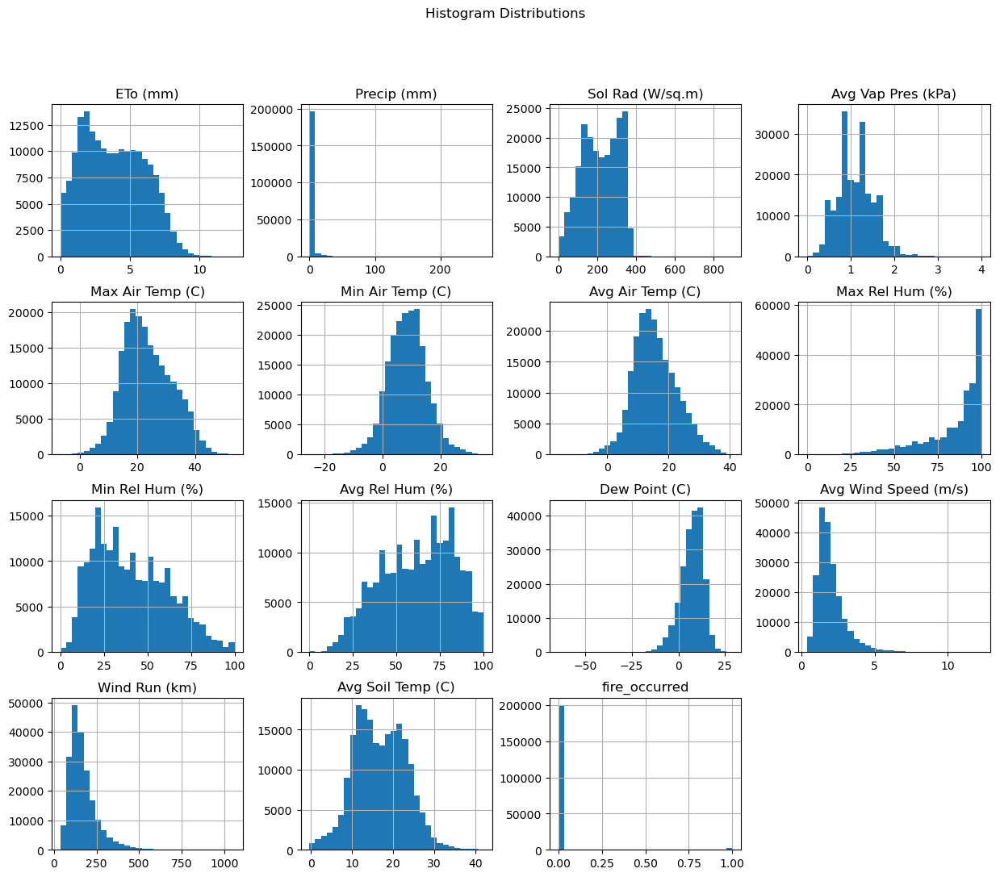

In [32]:
filtered_clean_data.hist(figsize=(15, 12), bins=30)
plt.suptitle("Histogram Distributions")
plt.show()

In [8]:

x_data = cleaned_data[feature_cols]
y_data = cleaned_data[label]

#split data for train/test
X_train, X_test, y_train, y_test = train_test_split(x_data, y_data, test_size=0.2, random_state=1234)


def normalize_features(df, feature_cols):
    '''normalize selected features in dataframe with z-score standardization'''
    scaler = StandardScaler() 
    df_scaled = df.copy()
    df_scaled[feature_cols] = scaler.fit_transform(df[feature_cols])
    return df_scaled,scaler

normalized_X_train, X_train_scaler = normalize_features(X_train, feature_cols)

#normalize x data on train set
normalized_X_test = X_train_scaler.transform(X_test)

In [9]:
normalized_X_train.shape

(162185, 14)

In [10]:
normalized_X_train.head()

,ETo (mm),Precip (mm),Sol Rad (W/sq.m),Avg Vap Pres (kPa),Max Air Temp (C),Min Air Temp (C),Avg Air Temp (C),Max Rel Hum (%),Min Rel Hum (%),Avg Rel Hum (%),Dew Point (C),Avg Wind Speed (m/s),Wind Run (km),Avg Soil Temp (C)
187408,-1.282474,-0.200368,-1.169237,-0.710389,-1.333149,-1.501399,-1.466590,0.900340,1.196116,1.306332,-0.600608,-0.782870,-0.824810,-1.265256
75586,-1.096565,-0.180770,-1.063261,-0.221809,-0.645732,-0.789079,-0.817060,0.781356,0.534231,1.017982,-0.033044,-0.477930,-0.503499,-0.866418
51218,-0.593252,-0.200368,-0.395612,-1.687548,-1.842786,-1.804515,-1.904317,0.483894,-0.174932,0.008756,-1.865465,2.063233,2.103475,-1.999118
67048,0.957496,-0.200368,1.310602,-1.198969,0.089093,0.226357,0.227836,-0.824940,-1.073205,-1.384937,-1.070876,-0.884516,-0.878950,0.681073
41503,0.771588,-0.200368,0.664148,4.908278,1.665411,2.711902,2.359990,0.364909,0.156010,0.056814,2.788559,-0.477930,-0.482314,2.084982


In [11]:
# Ensure we're working on a fresh copy to avoid SettingWithCopyWarning
cleaned_data = cleaned_data.copy()

# List of features to apply 7-day trailing average to
features_to_avg = [
    'ETo (mm)',
    'Precip (mm)',
    'Sol Rad (W/sq.m)',
    'Avg Vap Pres (kPa)',
    'Max Air Temp (C)',
    'Min Air Temp (C)',
    'Avg Air Temp (C)',
    'Max Rel Hum (%)',
    'Min Rel Hum (%)',
    'Avg Rel Hum (%)',
    'Dew Point (C)',
    'Avg Wind Speed (m/s)',
    'Wind Run (km)',
    'Avg Soil Temp (C)'
]

#Calculate trailing average per station
for col in features_to_avg:
    cleaned_data[f'{col}_7d_avg'] = (
        cleaned_data
        .groupby('StationNbr')[col]
        .transform(lambda x: x.rolling(7, min_periods=1).mean())
    )

In [12]:
# Get only trailing features + target
trailing_avg_cols = [f'{col}_7d_avg' for col in features_to_avg] + ['fire_occurred']
trailing_df = cleaned_data[trailing_avg_cols].dropna()

# Compute correlation matrix
corr_matrix = trailing_df.corr()

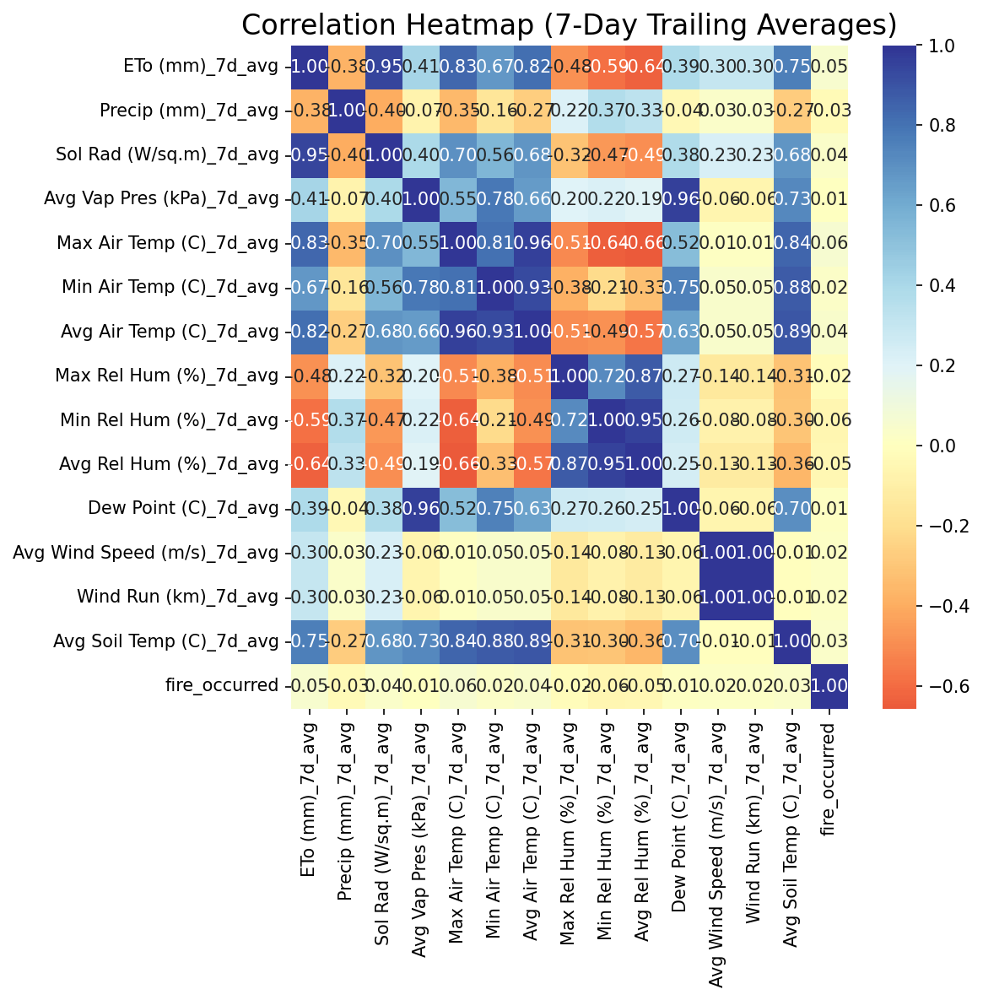

In [13]:
plt.figure(figsize=(8, 8), dpi=150)
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt='.2f',
    cmap='RdYlBu',
    center=0
)
plt.title("Correlation Heatmap (7-Day Trailing Averages)", fontsize=16)
plt.tight_layout()
plt.show()

In [47]:
RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=42) #fix class imbalanced

RandomForestClassifier(class_weight='balanced', random_state=42)

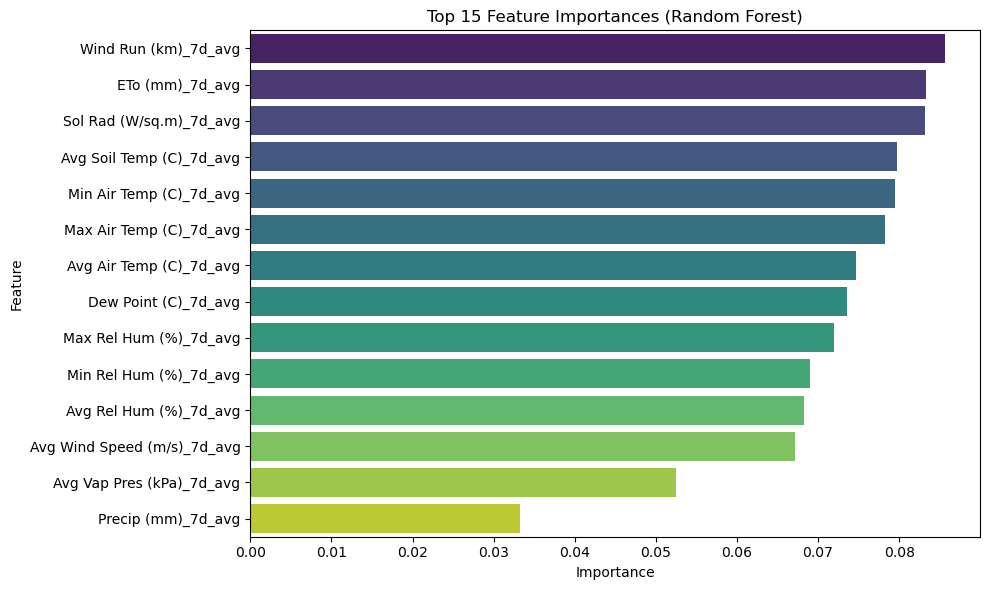

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     36307
           1       1.00      0.05      0.10       427

    accuracy                           0.99     36734
   macro avg       0.99      0.53      0.55     36734
weighted avg       0.99      0.99      0.98     36734



In [48]:
#Select features and target
all_trailing_features = [col for col in cleaned_data.columns if '_7d_avg' in col]
X = cleaned_data[all_trailing_features]
y = cleaned_data['fire_occurred']

#Drop missing values
X = X.dropna()
y = y.loc[X.index]

#Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#quick standardization (just in case for later)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Train Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_scaled, y_train)

#Feature importances
importances = rf.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

#plot
plt.figure(figsize=(10, 6))
sns.barplot(
    x='Importance',
    y='Feature',
    data=feature_importance_df.head(15),
    hue='Feature',
    palette='viridis',
    legend=False
)
plt.title('Top 15 Feature Importances (Random Forest)')
plt.tight_layout()
plt.show()

#classification report
y_pred = rf.predict(X_test_scaled)
print(classification_report(y_test, y_pred))

In [49]:
# Estimate imbalance ratio
imbalance_ratio = y_train.value_counts()[0] / y_train.value_counts()[1]

#XGBoost with class weight
xgb = XGBClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=6,
    scale_pos_weight=imbalance_ratio, #handles the imbalanced data
    eval_metric='logloss',
    random_state=42
)
xgb.fit(X_train_scaled, y_train)

# Predict + evaluate
y_pred = xgb.predict(X_test_scaled)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.74      0.85     36307
           1       0.03      0.73      0.06       427

    accuracy                           0.74     36734
   macro avg       0.51      0.73      0.45     36734
weighted avg       0.98      0.74      0.84     36734



              precision    recall  f1-score   support

           0       1.00      0.74      0.85     36307
           1       0.03      0.73      0.06       427

    accuracy                           0.74     36734
   macro avg       0.51      0.73      0.45     36734
weighted avg       0.98      0.74      0.84     36734



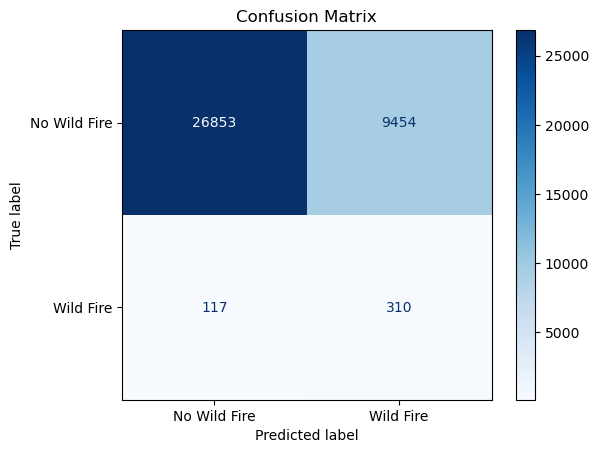

In [50]:
xgb.fit(X_train_scaled, y_train) #fit the quick model to evaluate
y_pred = xgb.predict(X_test_scaled)
print(classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Wild Fire', 'Wild Fire'])
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

In [20]:
# define an instance of the early_stopping class
early_stopping = tf.keras.callbacks.EarlyStopping(
monitor='accuracy', 
verbose=1,
patience=5,
mode='max',
restore_best_weights=True)


In [23]:
X_train_scaled.shape[1]

14

In [25]:
def build_model(
                hidden_layer_sizes=[],
                activation='relu',
                optimizer='SGD',
                learning_rate=0.01,
                metric='accuracy'):
    """Build a multi-class logistic regression model using Keras.

    Args:
    n_classes: Number of output classes in the dataset.
    hidden_layer_sizes: A list with the number of units in each hidden layer.
    activation: The activation function to use for the hidden layers.
    optimizer: The optimizer to use (SGD, Adam).
    learning_rate: The desired learning rate for the optimizer.
    metric: The desired metric.

    Returns:
    model: A tf.keras model (graph).
    """
    
    
    tf.keras.backend.clear_session()
    np.random.seed(0)
    tf.random.set_seed(0)
    
    model = tf.keras.Sequential()
    
    #guide: https://stackoverflow.com/questions/44747343/keras-input-explanation-input-shape-units-batch-size-dim-etc
    
    #adding an additional if layer if hidden layer is empty, just do softmax
    
    if hidden_layer_sizes:
        #first hidden layer    
        '''This is my first layer. We start out with the number of intitial features and pass thru relu as the activation function. We could technically pass through #s as parameters for units but will stick to one   '''
        model.add(tf.keras.layers.Dense(
            units = hidden_layer_sizes[0],
            activation = activation, #activation relu 
            kernel_initializer=initializers.RandomNormal(stddev=0.01), #for neural networks we want to break the symmetry and assign random weights
            bias_initializer=initializers.RandomNormal(stddev=0.01)
        ))
        
        '''This section is for subsquent hidden layers that are added to the neural network  '''
        for size in hidden_layer_sizes[1:]:
            model.add(tf.keras.layers.Dense(
                units = size,
                activation = activation,
                kernel_initializer=initializers.RandomNormal(stddev=0.01), #for neural networks we want to break the symmetry and assign random weights
                bias_initializer=initializers.RandomNormal(stddev=0.01)
            ))
            
        model.add(tf.keras.layers.Dense(
            units = 1,
            use_bias = True,
            activation = 'sigmoid'
        ))
    else: 
        model.add(tf.keras.layers.Dense(
        units=1, 
        activation='sigmoid',
        use_bias=True
        ))
    
    #optimizer
    
    if optimizer == 'SGD':
        optimizer = tf.keras.optimizers.SGD(learning_rate = learning_rate)
    elif optimizer == 'Adam':
        optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)
    else:
        raise ValueError("Unsupported optimizer: choose SGD or Adam.")
    

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                loss=tf.keras.losses.BinaryCrossentropy(),
                metrics=['accuracy']) 

    return model

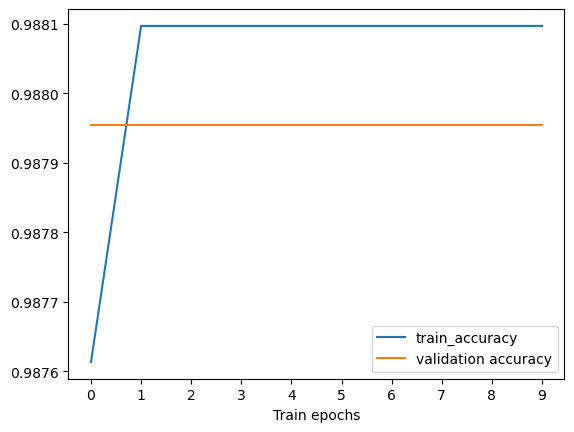

Training accuracy: 0.9881
Validation accuracy: 0.9880
Test accuracy: 0.9884
1148/1148 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step


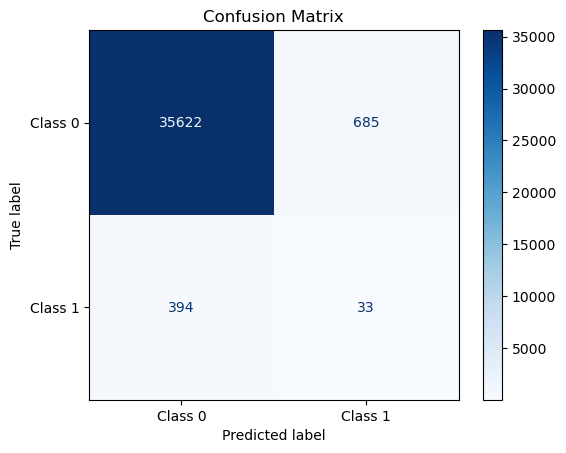


Threshold: 0.5
[[36307     0]
 [  427     0]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     36307
           1       0.00      0.00      0.00       427

    accuracy                           0.99     36734
   macro avg       0.49      0.50      0.50     36734
weighted avg       0.98      0.99      0.98     36734



/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


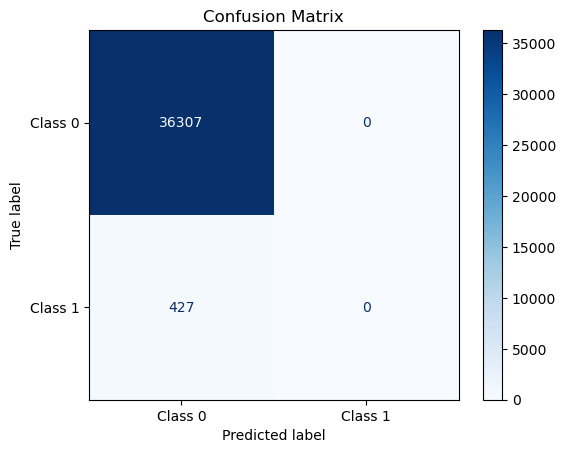


Threshold: 0.4
[[36307     0]
 [  427     0]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     36307
           1       0.00      0.00      0.00       427

    accuracy                           0.99     36734
   macro avg       0.49      0.50      0.50     36734
weighted avg       0.98      0.99      0.98     36734



/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


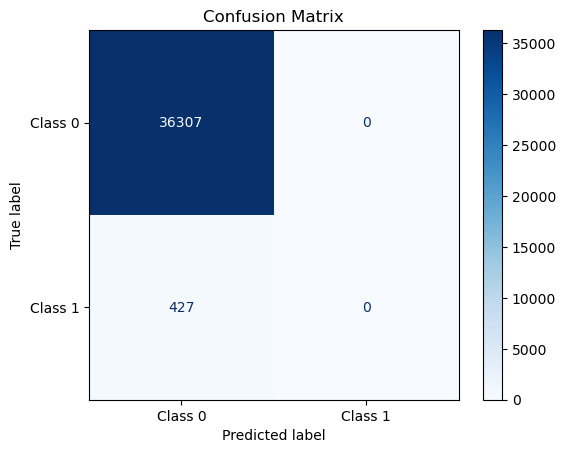


Threshold: 0.3
[[36307     0]
 [  427     0]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     36307
           1       0.00      0.00      0.00       427

    accuracy                           0.99     36734
   macro avg       0.49      0.50      0.50     36734
weighted avg       0.98      0.99      0.98     36734



/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


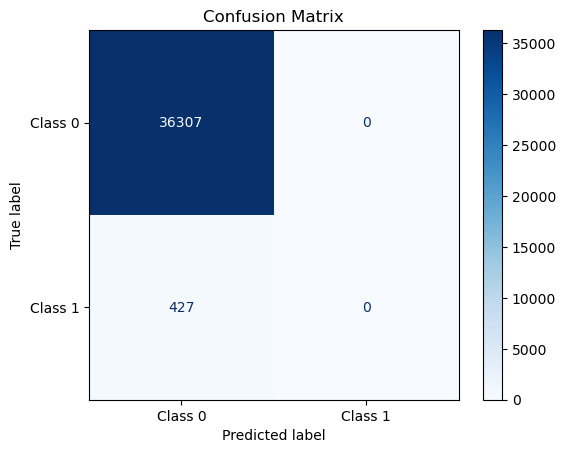


Threshold: 0.2
[[36307     0]
 [  427     0]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     36307
           1       0.00      0.00      0.00       427

    accuracy                           0.99     36734
   macro avg       0.49      0.50      0.50     36734
weighted avg       0.98      0.99      0.98     36734



/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


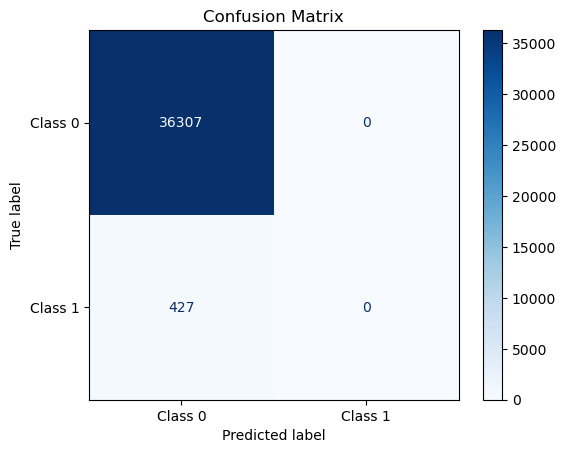


Threshold: 0.05
[[36274    33]
 [  425     2]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     36307
           1       0.06      0.00      0.01       427

    accuracy                           0.99     36734
   macro avg       0.52      0.50      0.50     36734
weighted avg       0.98      0.99      0.98     36734



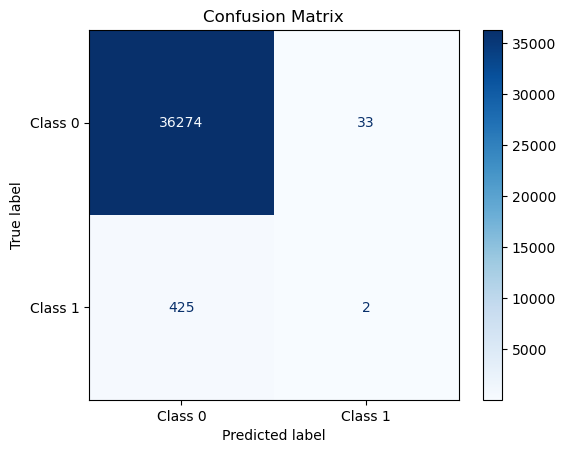


Threshold: 0.03
[[35622   685]
 [  394    33]]
              precision    recall  f1-score   support

           0       0.99      0.98      0.99     36307
           1       0.05      0.08      0.06       427

    accuracy                           0.97     36734
   macro avg       0.52      0.53      0.52     36734
weighted avg       0.98      0.97      0.97     36734



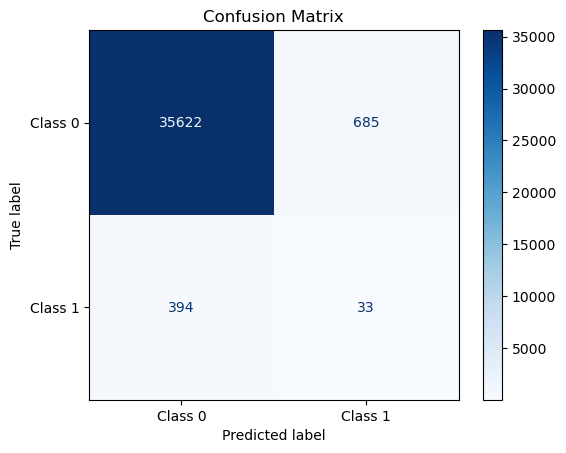


Threshold: 0.015
[[30925  5382]
 [  268   159]]
              precision    recall  f1-score   support

           0       0.99      0.85      0.92     36307
           1       0.03      0.37      0.05       427

    accuracy                           0.85     36734
   macro avg       0.51      0.61      0.48     36734
weighted avg       0.98      0.85      0.91     36734



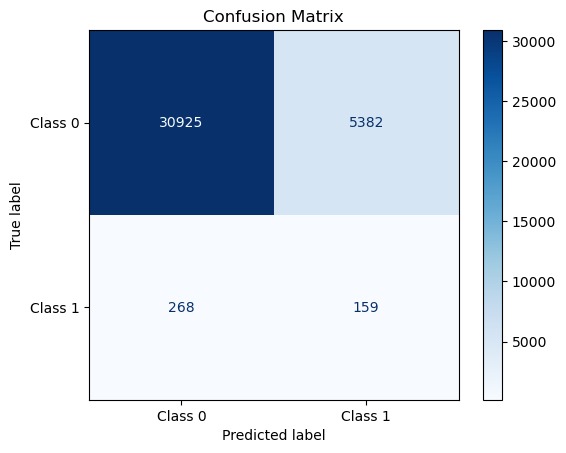


Threshold: 0.01
[[25156 11151]
 [  144   283]]
              precision    recall  f1-score   support

           0       0.99      0.69      0.82     36307
           1       0.02      0.66      0.05       427

    accuracy                           0.69     36734
   macro avg       0.51      0.68      0.43     36734
weighted avg       0.98      0.69      0.81     36734



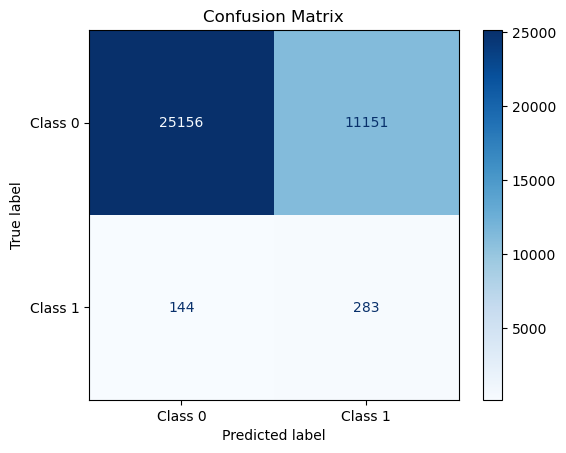

In [44]:
def train_and_evaluate(
                       hidden_layer_sizes=[50,25,10,10],
                       activation='relu',
                       optimizer='Adam',
                       learning_rate=0.01,
                       metric='accuracy',
                       num_epochs=10):

    # Build the model
    model = build_model(
        hidden_layer_sizes=hidden_layer_sizes,
        activation=activation,
        optimizer=optimizer,
        metric=metric,
        learning_rate=learning_rate
    )

    X_train = X_train_scaled
    X_test = X_test_scaled
    Y_train = y_train
    Y_test = y_test
    

    # Train the model
    history = model.fit(
        x=X_train,
        y=Y_train,
        epochs=num_epochs,
        batch_size=64,
        validation_split=0.1,
        verbose=0
    )

    # Plot training and validation accuracy
    train_accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    plt.plot(train_accuracy, label='train_accuracy')
    plt.plot(val_accuracy, label='validation accuracy')
    plt.xticks(range(num_epochs))
    plt.xlabel('Train epochs')
    plt.legend()
    plt.show()

    print('Training accuracy: %1.4f' % train_accuracy[-1])
    print('Validation accuracy: %1.4f' % val_accuracy[-1])

    # Evaluate on test data
    test_loss, test_accuracy = model.evaluate(X_test, Y_test, verbose=0)
    print('Test accuracy: %1.4f' % test_accuracy)

    # Predict on test data
    y_pred_probs = model.predict(X_test)
    y_pred = (y_pred_probs > 0.03).astype(int)  # binary classification threshold

    # Confusion Matrix
    cm = confusion_matrix(Y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Wildfire', 'Wildfire'])
    disp.plot(cmap='Blues')
    plt.title('Confusion Matrix')
    plt.show()
    
    thresholds = [0.5, 0.4, 0.3, 0.2,.05,.03,.015,.01]

    for t in thresholds:
      y_pred = (y_pred_probs > t).astype(int)
      print(f"\nThreshold: {t}")
      print(confusion_matrix(y_test, y_pred))
      print(classification_report(y_test, y_pred))
      cm = confusion_matrix(Y_test, y_pred)
      disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Wildfire', 'Wildfire'])
      disp.plot(cmap='Blues')
      plt.title('Confusion Matrix')
      plt.show()

    return model


# run the function
model = train_and_evaluate()


#we have some serious class imbalance
#our features aren't that strong for this model 



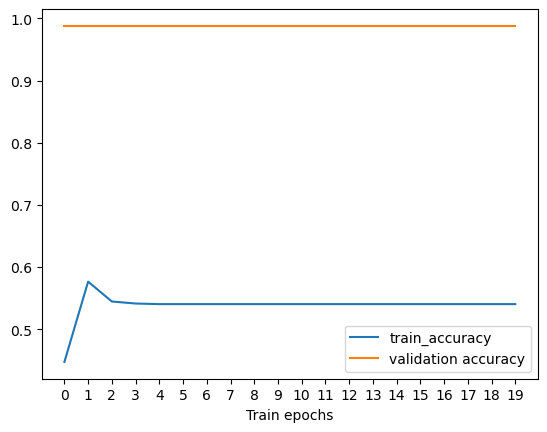

Training accuracy: 0.5404
Validation accuracy: 0.9880
Test accuracy: 0.9884
1148/1148 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step

Threshold: 0.75
[[36307     0]
 [  427     0]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     36307
           1       0.00      0.00      0.00       427

    accuracy                           0.99     36734
   macro avg       0.49      0.50      0.50     36734
weighted avg       0.98      0.99      0.98     36734



/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


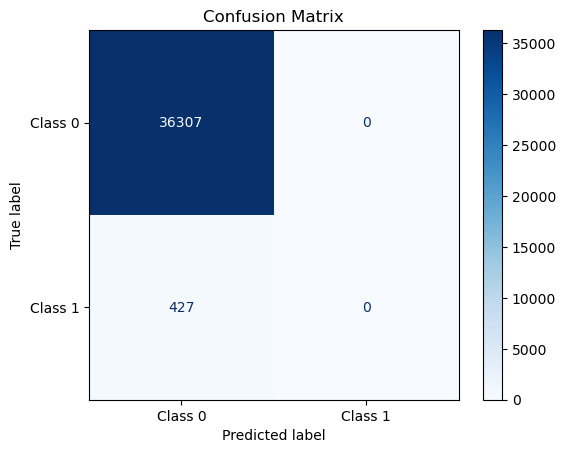


Threshold: 0.5
[[36307     0]
 [  427     0]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     36307
           1       0.00      0.00      0.00       427

    accuracy                           0.99     36734
   macro avg       0.49      0.50      0.50     36734
weighted avg       0.98      0.99      0.98     36734



/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


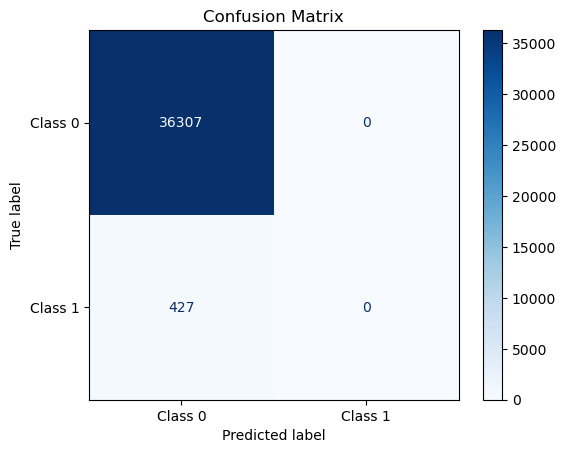


Threshold: 0.4
[[    0 36307]
 [    0   427]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00     36307
           1       0.01      1.00      0.02       427

    accuracy                           0.01     36734
   macro avg       0.01      0.50      0.01     36734
weighted avg       0.00      0.01      0.00     36734



/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


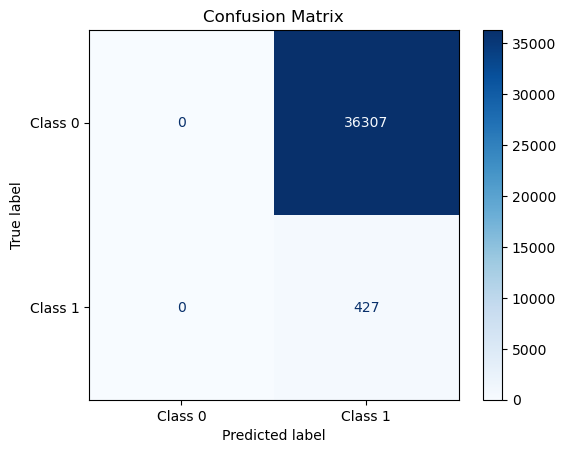


Threshold: 0.3
[[    0 36307]
 [    0   427]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00     36307
           1       0.01      1.00      0.02       427

    accuracy                           0.01     36734
   macro avg       0.01      0.50      0.01     36734
weighted avg       0.00      0.01      0.00     36734



/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


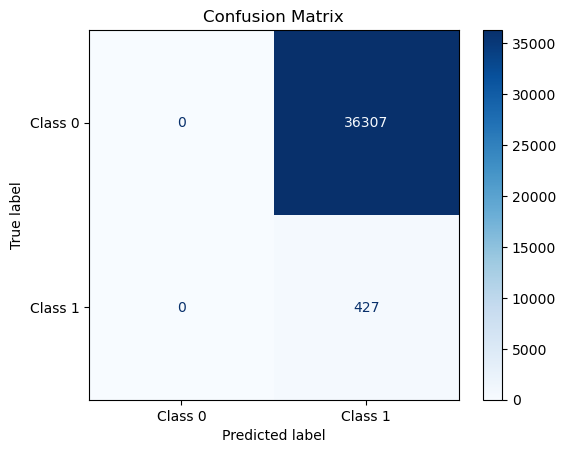


Threshold: 0.2
[[    0 36307]
 [    0   427]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00     36307
           1       0.01      1.00      0.02       427

    accuracy                           0.01     36734
   macro avg       0.01      0.50      0.01     36734
weighted avg       0.00      0.01      0.00     36734



/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


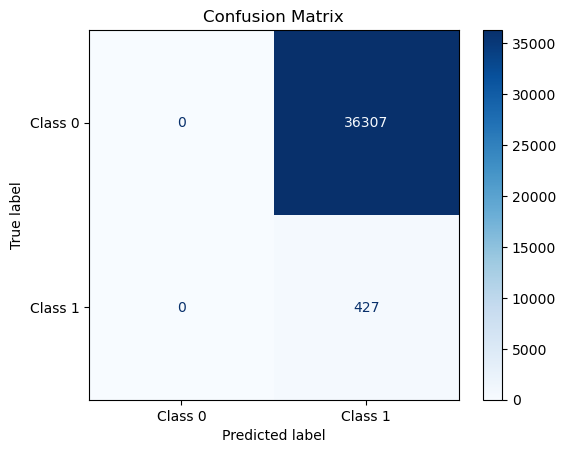


Threshold: 0.01
[[    0 36307]
 [    0   427]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00     36307
           1       0.01      1.00      0.02       427

    accuracy                           0.01     36734
   macro avg       0.01      0.50      0.01     36734
weighted avg       0.00      0.01      0.00     36734



/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


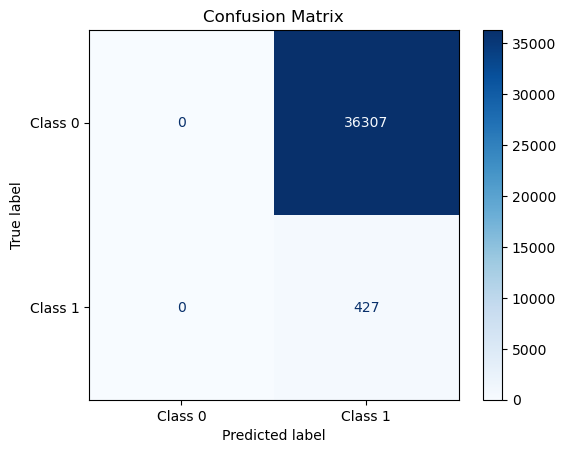


Threshold: 0.05
[[    0 36307]
 [    0   427]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00     36307
           1       0.01      1.00      0.02       427

    accuracy                           0.01     36734
   macro avg       0.01      0.50      0.01     36734
weighted avg       0.00      0.01      0.00     36734



/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


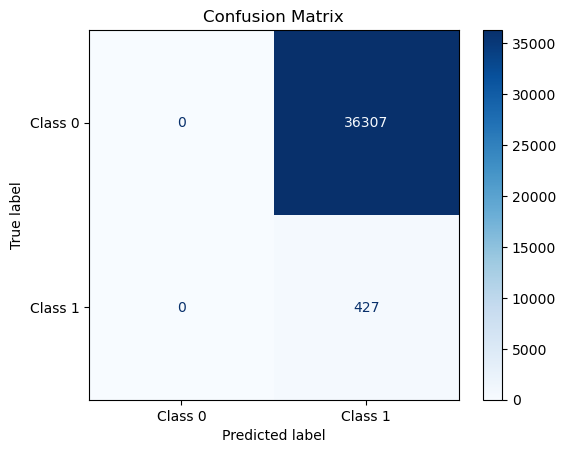


Threshold: 0.025
[[    0 36307]
 [    0   427]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00     36307
           1       0.01      1.00      0.02       427

    accuracy                           0.01     36734
   macro avg       0.01      0.50      0.01     36734
weighted avg       0.00      0.01      0.00     36734



/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


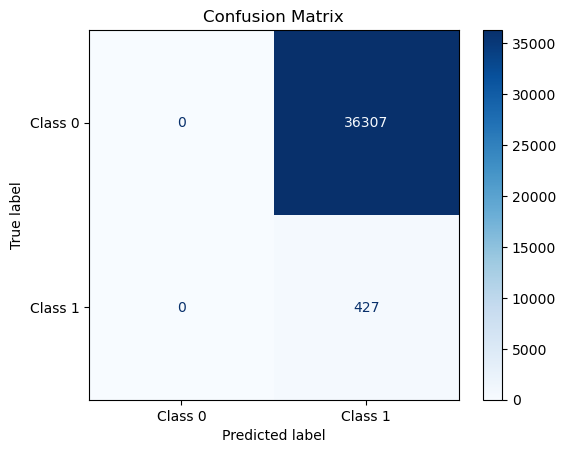


Threshold: 0.01
[[    0 36307]
 [    0   427]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00     36307
           1       0.01      1.00      0.02       427

    accuracy                           0.01     36734
   macro avg       0.01      0.50      0.01     36734
weighted avg       0.00      0.01      0.00     36734



/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


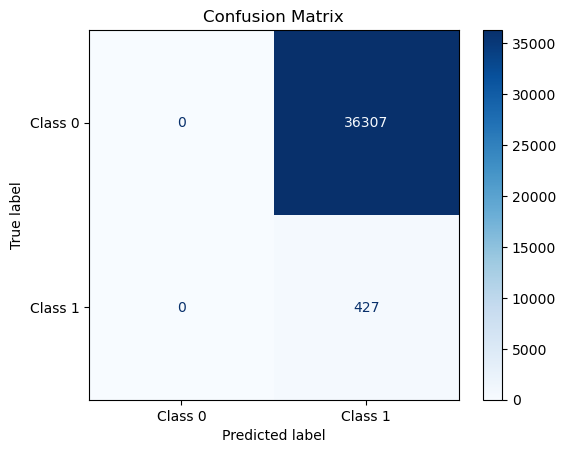

In [46]:
def train_and_evaluate(
                       hidden_layer_sizes=[100,50,25,25,10,10],
                       activation='relu',
                       optimizer='Adam',
                       learning_rate=0.01,
                       metric='accuracy',
                       num_epochs=20):

    # Build the model
    model = build_model(
        hidden_layer_sizes=hidden_layer_sizes,
        activation=activation,
        optimizer=optimizer,
        metric=metric,
        learning_rate=learning_rate
    )

    X_train = X_train_scaled
    X_test = X_test_scaled
    Y_train = y_train
    Y_test = y_test
    
    class_weights_array = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
    class_weights = dict(enumerate(class_weights_array)) #class weights passed through the model. The weights are meant to pass through the model so that the loss function treats the minority classes as much important

    # Train the model
    history = model.fit(
        x=X_train,
        y=Y_train,
        epochs=num_epochs,
        batch_size=64,
        validation_split=0.1,
        verbose=0,
        class_weight = class_weights
    )

    # Plot training and validation accuracy
    train_accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    plt.plot(train_accuracy, label='train_accuracy')
    plt.plot(val_accuracy, label='validation accuracy')
    plt.xticks(range(num_epochs))
    plt.xlabel('Train epochs')
    plt.legend()
    plt.show()

    print('Training accuracy: %1.4f' % train_accuracy[-1])
    print('Validation accuracy: %1.4f' % val_accuracy[-1])

    # Evaluate on test data
    test_loss, test_accuracy = model.evaluate(X_test, Y_test, verbose=0)
    print('Test accuracy: %1.4f' % test_accuracy)
    y_pred_probs = model.predict(X_test)

    thresholds = [0.75, 0.5, .4 , 0.3, 0.2,.01,.05,.025,.01]

    for t in thresholds:
      y_pred = (y_pred_probs > t).astype(int)
      print(f"\nThreshold: {t}")
      print(confusion_matrix(y_test, y_pred))
      print(classification_report(y_test, y_pred))
      cm = confusion_matrix(Y_test, y_pred)
      disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Wildfire', 'Wildfire'])
      disp.plot(cmap='Blues')
      plt.title('Confusion Matrix')
      plt.show()

    return model


# run the function
model = train_and_evaluate()


#we have some serious class imbalance
#our features aren't that strong for this model 



We trainned a neural network on our wildfire training data, and attempting to account for class imbalance by calculating and passing class_weight to the model during training. These weights were derived from the frequency of each class, non-wildfires and wildfires, in the training set. Wildfires, being the minority class, were given higher weight so the loss function treats it as more important.

However, based on our earlier feature analysis (see correlation matrix), we know our features don’t contain strong predictive signal. So even though the class-weighted model tries harder to catch wildfires, it’s not learning anything meaningful. This resulted in the model producing poor accuracy at 54% and unstable performance. Since this model significantly underperforms, we discard this model.

When comparing this class-weighted neural net to a fully connected network (FNN) without class weights, the FNN actually performs better. It matches or slightly outperforms a Random Forest model that does account for class imbalance in terms of accuracy but results across these models don't seem to translate well. Results below:

	•	Random Forest:
Accuracy = 75%, Precision = 3%, Recall = 73%
(Still poor precision, but at least high recall)

	•	Neural Net with threshold 1.5%:

Accuracy = 85%, Precision = 3%, Recall = 37%
(Again, seems like it’s guessing randomly with low confidence)


Overall, the main insight here is that no modeling technique can overcome the fact that our features just aren’t predictive. Whether we use class weights or adjust the decision threshold, the model will never perform well unless we collect features that actually help distinguish wildfires from non-wildfires.